# Comment Classification Project
**Author:** Kai Uechi

## Overview
The goal of this project is to train neural networks for automated content moderation. 
The best model created was able to correctly identify which comments to remove with 91.6% accuracy.
Additionally, combining the model with a text explainer allows for insight into the behavior of the neural network, and evaluation of the effectiveness of current moderation policies.
However, if given more computing resources it may be possible to create a more accurate model.

## Business Problem
As companies such as Twitter and Meta face challenges with racist, sexist and even criminal user-generated content, Reddit sees this as an opportunity to expand.
However, an increase in user-generated content carries risk: 
Existing community-run moderation systems have difficulty handling the increase in trolls and bad content.

In an attempt to combat this issue and enable the site to grow, this project investigates applying machine learning and neural networks to automate content moderation.
The final aim of this investigation being the creation of a more efficient moderation system that allows boards to better scale to high numbers of users.

## Data Understanding
The dataset used for this project is a selection of `223,372` reddit comments from the r/science board.

Several features are included in the dataset, but the only ones used in for this project are:
*    `body`: This contains the actual text content
*    `REMOVED`: This specifies if the comment was removed or not
    
    
The length and content can vary greatly from one comment to the next.
`86,016` of the comments were removed my moderators, while the other `137,356` were not.

The cells below display a sample of the data, summary metrics regarding the data, and a visualization of the dataset's label distribution.

In [1]:
import gensim
import pandas as pd
import numpy as np
pd.set_option('max_colwidth', 400)
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
from nltk import FreqDist
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize
from nltk.stem.snowball import SnowballStemmer
import nltk
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import confusion_matrix
from keras import metrics
from lime import lime_text
import tensorflow.keras.preprocessing
import tensorflow.keras.models as models
import tensorflow.keras.layers as layers
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import tensorflow as tf
from transformers import TFAutoModelForSequenceClassification
from transformers import AutoTokenizer
from transformers import create_optimizer
from transformers import DataCollatorWithPadding
from transformers import TFDistilBertModel
from datasets import Dataset
from os.path import exists
import joblib
import time
np.random.seed(8492)

In [2]:
train = pd.read_csv('data/reddit_200k_train.csv', encoding='ISO-8859-1')
test = pd.read_csv('data/reddit_200k_test.csv', encoding='ISO-8859-1')

In [3]:
train.head()

,Unnamed: 0,body,score.x,parent_id.x,id,created_utc.x,retrieved_on,REMOVED
0,1,I've always been taught it emerged from the earth after an impace. That is why it has similar elemental distribution to earth,2,t3_81u15i,dv551g6,1520121101,1524782256,False
1,2,"As an ECE, my first feeling as ""HEY THAT'S NOT-"" and then I thought about all the times my co-workers couldn't even write a simple message in our communication book without making mistakes. \r\n\r\nI'm getting out of the profession.",2,t3_72sk35,dnl66g6,1506533157,1507150439,True
2,3,Monday: Drug companies stock dives on good news for patients.,5,t3_8o88yr,e02sjhz,1528087570,1532170350,True
3,4,i learned that all hybrids are unfertile i wont read clickbaits https://biology.stackexchange.com/questions/16922/why-are-hybrids-infertile,0,t3_6xg9t8,dmfojjp,1504290041,1506407514,False
4,5,Well i was wanting to get wasted tonight. Not so much after reading this article...,3,t3_99wi9m,e4rtew8,1535140675,1537893540,False


In [4]:
print('Total number of comments:', len(train) + len(test))
print('Length of train split:', len(train))
print('Length of test split:', len(test))
print('Relative test split size:', 1/((len(test)+len(train))/len(test)))
kept, removed = pd.concat([train['REMOVED'], test['REMOVED']]).value_counts().values
print('Number of comments removed:', removed)
print('Number of comments kept:', kept)

Total number of comments: 223372
Length of train split: 167529
Length of test split: 55843
Relative test split size: 0.25
Number of comments removed: 86016
Number of comments kept: 137356


Label distribution:
 False    0.61492
True     0.38508
Name: REMOVED, dtype: float64


Text(1.93, 0.43507959815912467, '38.51%')

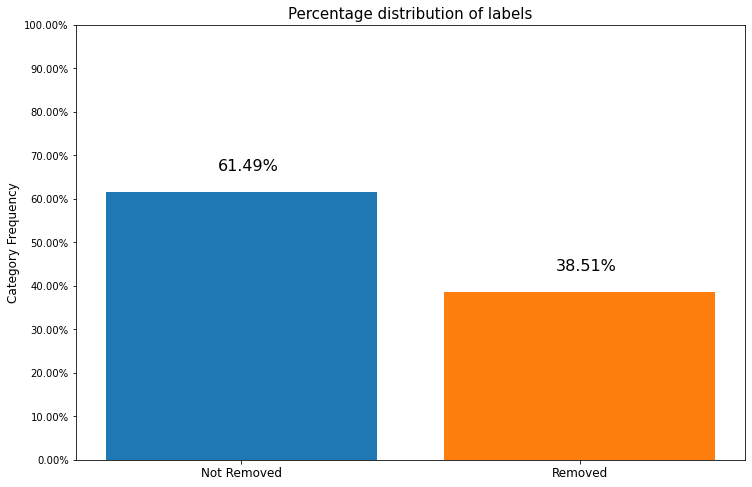

In [5]:
#display label distribution
percentage_not_removed = pd.concat([train['REMOVED'], test['REMOVED']]).value_counts(normalize=True)[0]
percentage_removed = pd.concat([train['REMOVED'], test['REMOVED']]).value_counts(normalize=True)[1]
print('Label distribution:\n', pd.concat([train['REMOVED'], test['REMOVED']]).value_counts(normalize=True))

fig, ax = plt.subplots(figsize=(12,8))
ax.bar(1, percentage_not_removed, label='Not Removed')
ax.bar(2, percentage_removed, label='Removed')
ax.set_title('Percentage distribution of labels', fontsize=15)
plt.xticks([1,2],['Not Removed', 'Removed'], fontsize=12)
plt.tick_params(
    axis='x',
    which='minor',
    bottom=False,
    top=False,
    labelbottom=False)
plt.ylabel('Category Frequency', fontsize=12)
plt.ylim(0, 1)
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0, decimals=2))
plt.yticks([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])
plt.text(1 -0.07, percentage_not_removed + 0.05, "{:.2%}".format(percentage_not_removed), fontsize=16)
plt.text(2 -0.07, percentage_removed + 0.05, "{:.2%}".format(percentage_removed), fontsize=16)

## Data Preprocessing

The data preprocessing steps are as follows:
* Concatenate both train and test sets to a single dataset
* Drop unused columns
* Set all text to lowercase
* Remove all special characters and stopwords 
* Tokenize and lemmatize text 
* Remove rows that no longer contain text

Additionally, some messages appear to be automated removal notifications, rather than user comments.

Since these are not representative of the sort of content the model will be moderating, they have been removed.

In [6]:
# Comment removal messages are contained in this set, too.
# Since these are automated or from moderators, they do not 
# represent the kinds of comments the model will actually be working with.
train.loc[train['body'].str.contains('has been removed because')]

,Unnamed: 0,body,score.x,parent_id.x,id,created_utc.x,retrieved_on,REMOVED
425,426,"Hi Z0idberg_MD, your submission has been removed for the following reason(s)\r\n \r\nYour submission has been removed because flair has not been assigned. \r\n \r\n*This removal was automatic. If you feel this was done in error, or would like further clarification, please add flair to the post and then [message the mods](http://www.reddit.com/message/compose?to=%2Fr%2FScience&amp;amp;message=M...",4,t3_78bxng,dosmmc6,1508803513,1510120310,False
470,471,"Hi 432_Hz, your submission has been removed for the following reason(s)\r\n \r\nYour submission has been removed because flair has not been assigned. \r\n \r\n*This removal was automatic. If you feel this was done in error, or would like further clarification, please add flair to the post and then [message the mods](http://www.reddit.com/message/compose?to=%2Fr%2FScience&amp;amp;message=My%20P...",2,t3_7gu35y,dqlpg3r,1512123314,1514226457,True
1736,1737,"Hi xxxlovelit, your submission has been removed for the following reason(s)\r\n \r\nYour submission has been removed because flair has not been assigned. \r\n \r\n*This removal was automatic. If you feel this was done in error, or would like further clarification, please add flair to the post and then [message the mods](http://www.reddit.com/message/compose?to=%2Fr%2FScience&amp;amp;message=My...",0,t3_9hqtmi,e6dssic,1537543212,1539369659,True
1890,1891,"Hi FM9022, your submission has been removed for the following reason(s)\r\n \r\nYour submission has been removed because flair has not been assigned. \r\n \r\n*This removal was automatic. If you feel this was done in error, or would like further clarification, please add flair to the post and then [message the mods](http://www.reddit.com/message/compose?to=%2Fr%2FScience&amp;amp;message=My%20P...",2,t3_7eywxu,dq8cqef,1511435412,1512927391,True
1972,1973,"Hi kolorful, your submission has been removed for the following reason(s)\r\n \r\nYour submission has been removed because flair has not been assigned. \r\n \r\n*This removal was automatic. If you feel this was done in error, or would like further clarification, please add flair to the post and then [message the mods](http://www.reddit.com/message/compose?to=%2Fr%2FScience&amp;amp;message=My%2...",2,t3_5x6s6e,defpo78,1488497714,1491157692,False
...,...,...,...,...,...,...,...,...
164288,164289,"Hi drewiepoodle, your submission has been removed for the following reason(s)\r\n \r\nYour submission has been removed because flair has not been assigned. \r\n \r\n*This removal was automatic. If you feel this was done in error, or would like further clarification, please add flair to the post and then [message the mods](http://www.reddit.com/message/compose?to=%2Fr%2FScience&amp;amp;message=...",0,t3_8nj7gg,dzvukp6,1527780311,1528193263,True
164987,164988,"Your submission has been removed because it violates our submission rules. Please read the [Rules for Headlines](https://www.reddit.com/r/science/wiki/clickbait) and contact the mods if you have further questions.\r\n\r\n*I am a bot, and this action was performed automatically. Please [contact the moderators of this subreddit](/message/compose/?to=/r/science) if you have any questions or conce...",2,t3_5n65jd,dc8x5ab,1484067606,1485934698,False
165061,165062,"Your submission has been removed because it violates our submission rules. Please read the [Rules for Headlines](https://www.reddit.com/r/science/wiki/clickbait) and contact the mods if you have further questions.\r\n\r\n*I am a bot, and this action was performed automatically. Please [contact the moderators of this subreddit](/message/compose/?to=/r/science) if you have any questions or conce...",2,t3_8kh0eu,dz7kvv3,1526682161,1527680654,False
166707,166708,"Hi giraldita, your submission has been removed for the following reason(s)\r\n \r\nYour submission has been removed because flair has not been assigned. \r\n \r\n*This removal was automatic.

In [7]:
stopwords_list = stopwords.words('english')

def remove_stopwords(input_list):
    output_list = []
    for word in input_list:
        if word not in stopwords_list:
            output_list.append(word)
    return output_list


def clean_input(input_df):
    df = input_df.copy() #copy df 

    #drop useless columns
    df.drop(['Unnamed: 0', 'score.x', 'parent_id.x', 'id', 'created_utc.x', 'retrieved_on'], axis=1, inplace=True)
    
    #lowercase
    df.body = df.body.str.lower()
    
    #drop all rows matching removal text
    df.drop(
        df.loc[df['body'].str.contains('your submission has been removed for the following')].index,
        inplace=True
    )
    
    df.drop(
        df.loc[df['body'].str.contains('has been removed because')].index,
        inplace=True
    )
    
    #strip special characters and tokenize
    pattern = r"(?u)\b\w\w+\b"
    tokenizer = RegexpTokenizer(pattern)
    df['tokenized'] = df['body'].apply(tokenizer.tokenize)
    
    #remove stopwords
    df['no_stop'] = df['tokenized'].apply(remove_stopwords)
    
    #lemma
    lemma = nltk.stem.wordnet.WordNetLemmatizer()
    df['lemma'] = df['no_stop'].apply(lambda x: [lemma.lemmatize(y) for y in x])
    
    #save seperately as string
    df['clean_string'] = df['lemma'].apply(lambda x: ' '.join(x))
    
    #drop NaNs
    df.drop(df.loc[df['clean_string'].isna()].index, inplace=True)
    
    #drop empty strings
    df.drop(df.loc[df['clean_string'] == ''].index, inplace=True)
    #print(df.isna().sum())

    return df

#load cleaned csv if it already exists, otherwise clean and save
if exists('data/data_cleaned.csv'):
    data_cleaned = pd.read_csv('data/data_cleaned.csv', index_col='Unnamed: 0')

else:
    train_cleaned = clean_input(train)
    test_cleaned = clean_input(test)

    data_cleaned = pd.concat([train_cleaned, test_cleaned])
    data_cleaned.reset_index(inplace=True)
    data_cleaned.drop(['index'], axis=1, inplace=True)
    #data_cleaned.head()
    data_cleaned.to_csv('data/data_cleaned.csv')
    data_cleaned = pd.read_csv('data/data_cleaned.csv', index_col='Unnamed: 0')

In [8]:
data_cleaned.head()

,body,REMOVED,tokenized,no_stop,lemma,clean_string
0,i've always been taught it emerged from the earth after an impace. that is why it has similar elemental distribution to earth,False,"['ve', 'always', 'been', 'taught', 'it', 'emerged', 'from', 'the', 'earth', 'after', 'an', 'impace', 'that', 'is', 'why', 'it', 'has', 'similar', 'elemental', 'distribution', 'to', 'earth']","['always', 'taught', 'emerged', 'earth', 'impace', 'similar', 'elemental', 'distribution', 'earth']","['always', 'taught', 'emerged', 'earth', 'impace', 'similar', 'elemental', 'distribution', 'earth']",always taught emerged earth impace similar elemental distribution earth
1,"as an ece, my first feeling as ""hey that's not-"" and then i thought about all the times my co-workers couldn't even write a simple message in our communication book without making mistakes. \r\n\r\ni'm getting out of the profession.",True,"['as', 'an', 'ece', 'my', 'first', 'feeling', 'as', 'hey', 'that', 'not', 'and', 'then', 'thought', 'about', 'all', 'the', 'times', 'my', 'co', 'workers', 'couldn', 'even', 'write', 'simple', 'message', 'in', 'our', 'communication', 'book', 'without', 'making', 'mistakes', 'getting', 'out', 'of', 'the', 'profession']","['ece', 'first', 'feeling', 'hey', 'thought', 'times', 'co', 'workers', 'even', 'write', 'simple', 'message', 'communication', 'book', 'without', 'making', 'mistakes', 'getting', 'profession']","['ece', 'first', 'feeling', 'hey', 'thought', 'time', 'co', 'worker', 'even', 'write', 'simple', 'message', 'communication', 'book', 'without', 'making', 'mistake', 'getting', 'profession']",ece first feeling hey thought time co worker even write simple message communication book without making mistake getting profession
2,monday: drug companies stock dives on good news for patients.,True,"['monday', 'drug', 'companies', 'stock', 'dives', 'on', 'good', 'news', 'for', 'patients']","['monday', 'drug', 'companies', 'stock', 'dives', 'good', 'news', 'patients']","['monday', 'drug', 'company', 'stock', 'dive', 'good', 'news', 'patient']",monday drug company stock dive good news patient
3,i learned that all hybrids are unfertile i wont read clickbaits https://biology.stackexchange.com/questions/16922/why-are-hybrids-infertile,False,"['learned', 'that', 'all', 'hybrids', 'are', 'unfertile', 'wont', 'read', 'clickbaits', 'https', 'biology', 'stackexchange', 'com', 'questions', '16922', 'why', 'are', 'hybrids', 'infertile']","['learned', 'hybrids', 'unfertile', 'wont', 'read', 'clickbaits', 'https', 'biology', 'stackexchange', 'com', 'questions', '16922', 'hybrids', 'infertile']","['learned', 'hybrid', 'unfertile', 'wont', 'read', 'clickbaits', 'http', 'biology', 'stackexchange', 'com', 'question', '16922', 'hybrid', 'infertile']",learned hybrid unfertile wont read clickbaits http biology stackexchange com question 16922 hybrid infertile
4,well i was wanting to get wasted tonight. not so much after reading this article...,False,"['well', 'was', 'wanting', 'to', 'get', 'wasted', 'tonight', 'not', 'so', 'much', 'after', 'reading', 'this', 'article']","['well', 'wanting', 'get', 'wasted', 'tonight', 'much', 'reading', 'article']","['well', 'wanting', 'get', 'wasted', 'tonight', 'much', 'reading', 'article']",well wanting get wasted tonight much reading article


## Modeling

The next step in the project is to train and optimize a model to be used for content moderation.
Several types of models are created and compared with each other to determine the best performing model.

The model types used are:
* Naive Bayes
* Long Short-Term Memory Network
* Transformer

Once a model has been trained once, it will be saved into the `/models/` folder.
Subsequent runs of that cell will load the saved model, rather than train a new model.

### Baseline Model
The goal of the first model is to create a performance baseline, using only basic Naive Bayes and TFIDF with minimal text preprocessing.

The bar graph below shows the model's performance across several metrics. 
Following that, a confusion matrix visualizes the number of correct vs incorrect predictions.
Finally, the lime text explainer is used to try and determine which words lead the model to its prediction.
As expected, performance is very poor, with `62.4%` accuracy. It appears the model almost always chooses the majority class (`Not Removed`).
The results from the text explainer are similarly poor, as there isn't any clear and intuitive connection between words and likelihood of removal.

In [9]:
#setup metric displays
def getConfusionMatrix(estimator, data, target, labels=None):
    preds = estimator.predict(data)
    matrix_raw = confusion_matrix(target, preds)
    dfMatrix = pd.DataFrame(matrix_raw, index=labels, columns=labels)
    plt.subplots(figsize=(16,8))
    sns.heatmap(dfMatrix, annot=True, robust=True, fmt='g', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Class')
    plt.ylabel('True Class')
    return dfMatrix

def getScore(estimator, data, target, labels = None):
    preds = estimator.predict(data)
    results = {}
    results['Accuracy'] = accuracy_score(target, preds)
    results['F1'] = f1_score(target, preds, average='binary')
    results['Recall'] = recall_score(target, preds, average='binary')
    results['Precision'] = precision_score(target, preds, average='binary')
    
    dfResults = pd.DataFrame(results, index=labels)
    fig, ax = plt.subplots(figsize=(16,6))
    ax.barh((range(len(results))), results.values(), align='center')
    plt.xlim(0, 1.0)
    plt.yticks(np.arange(len(results)), results.keys())
    for i, v in enumerate(results.values()):
        #print(i, v)
        plt.text(v + 0.01, i - 0.001, str(round((v * 100),3)) + '%', fontsize=12)
    plt.title('Model Performance Summary')
    plt.ylabel('Metric')
    return dfResults

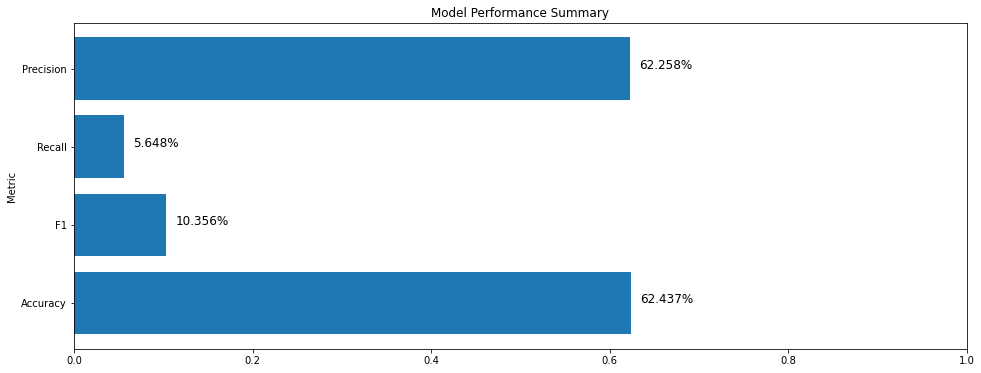

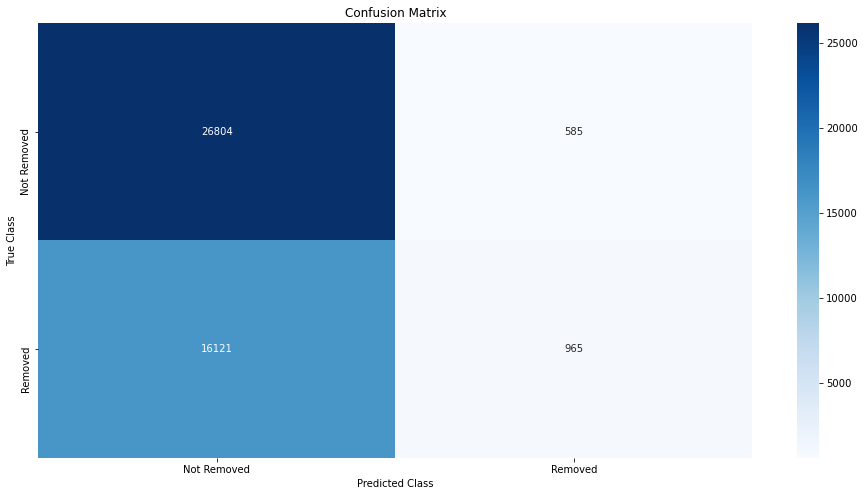

In [10]:
#baseline NB
#just tfidf, no lemma or stopword removal
X = data_cleaned['body']
y = data_cleaned['REMOVED']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=8492)

tfidf = TfidfVectorizer(max_features=100)

X_train_vectorized = tfidf.fit_transform(X_train)
X_test_vectorized = tfidf.transform(X_test)
X_test_vectorized_base = X_test_vectorized

baseline_model = MultinomialNB()

baseline_model.fit(X_train_vectorized, y_train)

labels = ['Not Removed', 'Removed']
test_baseline = getScore(baseline_model, X_test_vectorized, y_test, labels)
conf_baseline = getConfusionMatrix(baseline_model, X_test_vectorized, y_test, labels)

In [11]:
#baseline is only about %0.7 better than just picking majority class
y_test.value_counts(normalize=True)

False    0.615829
True     0.384171
Name: REMOVED, dtype: float64

In [12]:
#setup text explainer
def lime_predict_NB(text):
    text_processed = tfidf.transform(text)
    preds = exp_NB.predict_proba(text_processed)
    return preds

exp_NB = baseline_model
explainer = lime_text.LimeTextExplainer()
explanation = explainer.explain_instance(X_test.iloc[6], lime_predict_NB, num_samples=5000)
explanation.show_in_notebook()

### Tuned Naive Bayes

The second model also uses Naive Bayes, but now has higher max features and is trained on text that has had additional preprocessing.

This improves performance very slightly, but overall accuracy is still very poor, only `1.0%` better than the baseline model.
Despite these small improvements to the model's metrics, the results from the text explainer are still nonsensible.

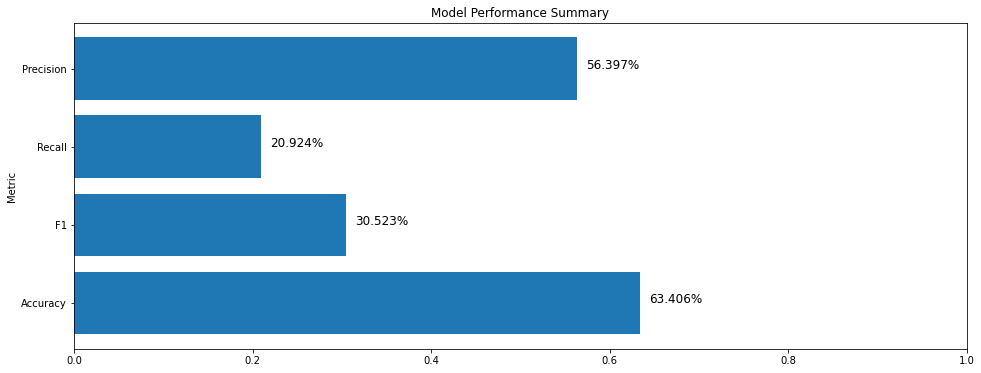

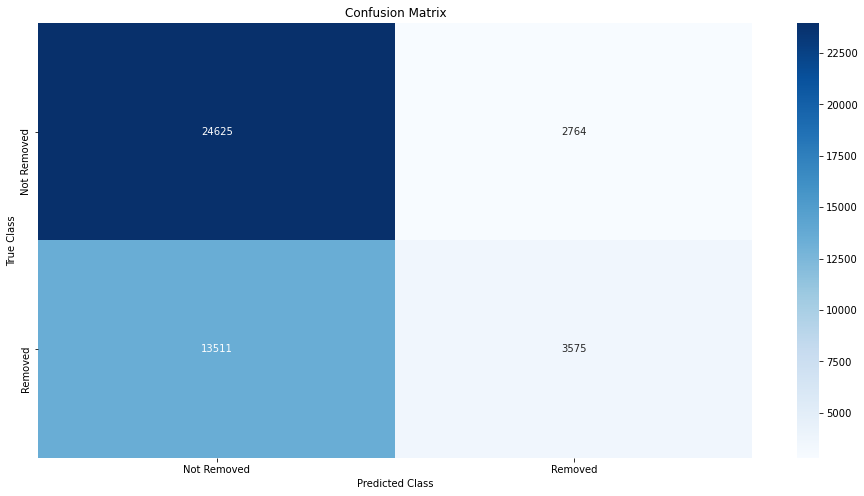

In [13]:
#NB with stopwords removed and lemmatizing (also higher max features)
X = data_cleaned['clean_string']
y = data_cleaned['REMOVED']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=8492)

tfidf = TfidfVectorizer(max_features=300)

X_train_vectorized = tfidf.fit_transform(X_train)
X_test_vectorized = tfidf.transform(X_test)
X_test_vectorized_clean = X_test_vectorized

NB_stop_lemma = MultinomialNB()
NB_stop_lemma.fit(X_train_vectorized, y_train)

test_NB_stop_lemma = getScore(NB_stop_lemma, X_test_vectorized, y_test, labels)
conf_NB_stop_lemma = getConfusionMatrix(NB_stop_lemma, X_test_vectorized, y_test, labels)

In [14]:
#very slightly better than baseline, still barely better than always picking majority

In [15]:
exp_NB = NB_stop_lemma
explainer = lime_text.LimeTextExplainer()
explanation = explainer.explain_instance(X_test.iloc[6], lime_predict_NB, num_samples=5000)
explanation.show_in_notebook()

### Long Short-Term Memory
The third model utilizes LSTM rather than Naive Bayes. 
This results in another small boost to model performance, now reaching `64.4%` accuracy.

Looking at the explanation, however, shows that the model has begun to focus on specific words.
The text explanation still doesn't demonstrate much understanding, but this is an improvement over previous NB models.

In [16]:
#split data for lstm models
X = data_cleaned['clean_string']
y = data_cleaned['REMOVED']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=8492)

#get y vals
y_train_final = y_train.astype(int).to_numpy()
y_test_final = y_test.astype(int).to_numpy()


train_list = X_train.to_list()
train_list_tokenized = []
for string in train_list:
    train_list_tokenized.append(string.split(' '))
    
print(train_list_tokenized[0:10])

test_list = X_test.to_list()
test_list_tokenized = []
for string in test_list:
    test_list_tokenized.append(string.split(' '))
    

#fit tokenizer, get vocab

tokenizer = tensorflow.keras.preprocessing.text.Tokenizer(lower=False, #already lowered
                                                          split=' ', 
                                                          oov_token="NaN", 
                                                          filters='!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n')
tokenizer.fit_on_texts(train_list_tokenized)

vocabulary = tokenizer.word_index

with open('models/lstm_tokenizer.pkl', 'wb') as f:
        joblib.dump(tokenizer, f)

#get sequence

train_sequence = tokenizer.texts_to_sequences(train_list_tokenized)

test_sequence = tokenizer.texts_to_sequences(test_list_tokenized)

#apply padding

train_seq_padded = tensorflow.keras.preprocessing.sequence.pad_sequences(train_sequence, 
                                                                         maxlen=15, 
                                                                         padding="post", 
                                                                         truncating="post")

test_seq_padded = tensorflow.keras.preprocessing.sequence.pad_sequences(test_sequence,
                                                                        maxlen=15, 
                                                                        padding='post', 
                                                                        truncating='post')

[['lot', 'people', 'read', 'headline', 'conclude', 'acupuncture', 'effective', 'much', 'likely', 'study', 'show', 'painkiller'], ['confirm', 'never', 'anything', 'worse', 'flu', 'flu', 'two', 'year', 'despite', 'fact', 'immunized'], ['pirate', 'pancreas'], ['oh', 'man', 'big', 'pharma', 'got', 'pissed'], ['understand', 'california', 'may', 'soon', 'require', 'labelling', 'coffee', 'carcinogen'], ['easier', 'fool', 'someone', 'convince', 'someone', 'fooled'], ['cannot', 'read', 'title'], ['want', 'watch', 'child', 'fighting', 'happened', 'tribal', 'warfare', 'today', 'like', 'congo', 'warlord'], ['assume', 'lack', 'paid', 'holiday', 'maternity', 'leave', 'much', 'effect', 'work', 'civilised', 'world'], ['keep', 'getting', 'posted', 'correlation', 'equal', 'causation', 'many', 'factor', 'declining', 'teen', 'pregnancy', 'rate']]


In [17]:


#setup early stopping
early_stopping = [EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True), 
                  ModelCheckpoint(filepath='models/checkpointTemp.h5', monitor='val_loss', save_best_only=True)]


In [18]:
#method to save model training history
def saveModelHistory(result_model, path):
    hist_df = pd.DataFrame(result_model.history)
    hist_json_file = path 
    with open(hist_json_file, mode='w') as f:
        hist_df.to_json(f)

In [19]:
#setup and train base lstm
if exists('models/lstm_base.h5'):
    lstm_base = models.load_model('models/lstm_base.h5')
    results_lstm_base = pd.read_json('models/results_lstm_base.json')
else:
    lstm_base = models.Sequential()
    lstm_base.add(layers.Input(shape=(15,)))
    lstm_base.add(layers.Embedding(input_dim=107260,
                                    output_dim=300,
                                    input_length=15,
                                    trainable=True))

    lstm_base.add(layers.Bidirectional(layers.LSTM(units=15,
                                                    dropout=0.2,
                                                    return_sequences=True)))

    lstm_base.add(layers.Bidirectional(layers.LSTM(units=15,
                                                    dropout=0.2)))

    lstm_base.add(layers.Dense(64, activation='relu'))
    lstm_base.add(layers.Dense(32, activation='relu'))

    lstm_base.add(layers.Dense(2, activation='softmax'))

    lstm_base.compile(loss='sparse_categorical_crossentropy',
                        optimizer='sgd',
                         metrics=['acc'])

    lstm_base.summary()

    results_lstm_base = lstm_base.fit(train_seq_padded, y_train_final,
                                        epochs=16,
                                        batch_size=128,
                                        validation_split=0.3,
                                        verbose=1,
                                        callbacks=early_stopping)
    
    lstm_base.save('models/lstm_base.h5')
    saveModelHistory(results_lstm_base, 'models/results_lstm_base.json')
    results_lstm_base = results_lstm_base.history

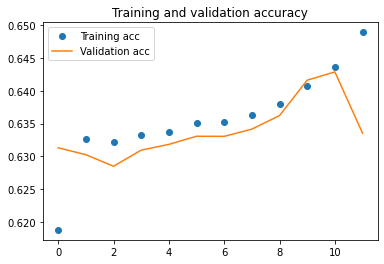

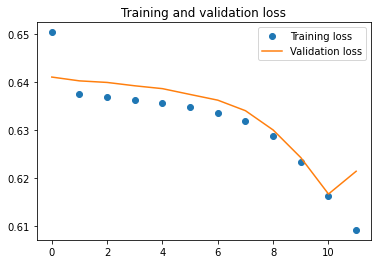

1390/1390 [==============================] - 8s 5ms/step


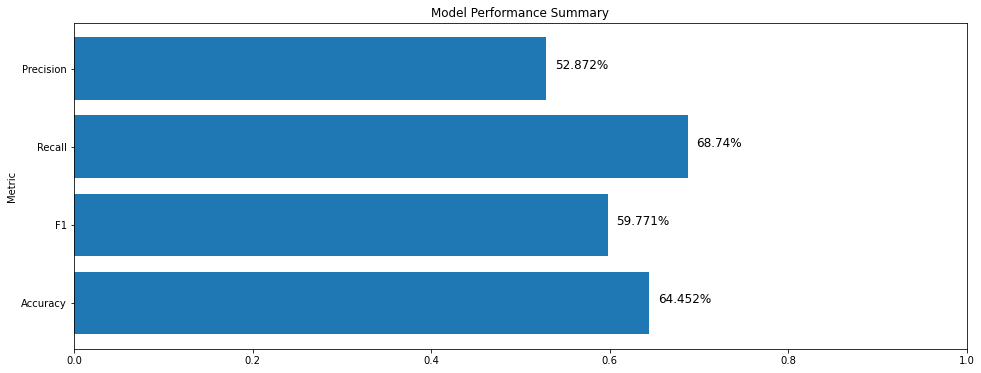

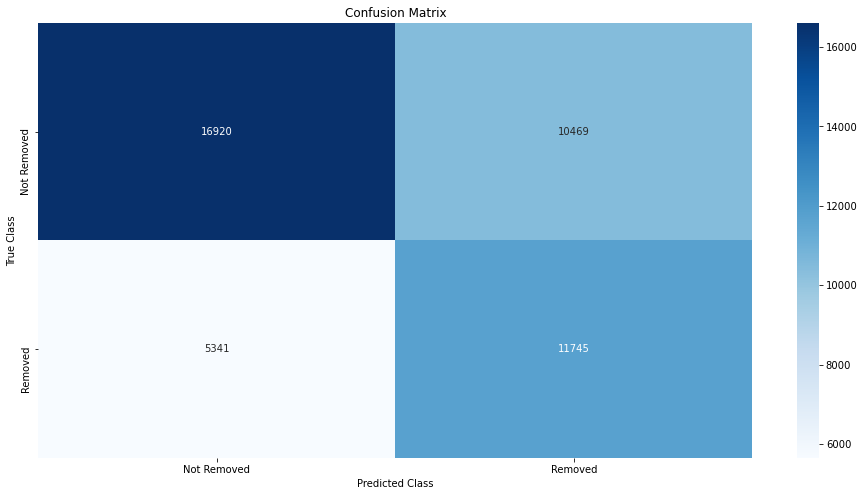

In [20]:
#setup lstm metric displays
def plotResults(history):
    acc = history['acc']
    val_acc = history['val_acc']
    loss = history['loss']
    val_loss = history['val_loss']
    epochs = range(len(acc))
    
    plt.plot(epochs, acc, 'o', label='Training acc')
    plt.plot(epochs, val_acc, label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()
    

    plt.figure()
    plt.plot(epochs, loss, 'o', label='Training loss')
    plt.plot(epochs, val_loss, label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()
    plt.show()

plotResults(results_lstm_base)

def get_lstm_preds(preds):
    preds_processed = []
    for prediction in preds:
        #print(prediction[1])
        if prediction[1] > 0.5:
            pred_result = 1
        else:
            pred_result = 0
        preds_processed.append(pred_result)
    return preds_processed

def getScore_lstm(estimator, data, target, labels = None):
    preds_raw = estimator.predict(data)
    preds = get_lstm_preds(preds_raw)
    results = {}
    results['Accuracy'] = accuracy_score(target, preds)
    results['F1'] = f1_score(target, preds, average='binary')
    results['Recall'] = recall_score(target, preds, average='binary')
    results['Precision'] = precision_score(target, preds, average='binary')
    
    dfResults = pd.DataFrame(results, index=labels)
    fig, ax = plt.subplots(figsize=(16,6))
    ax.barh((range(len(results))), results.values(), align='center')
    plt.xlim(0, 1.0)
    plt.yticks(np.arange(len(results)), results.keys())
    for i, v in enumerate(results.values()):
        plt.text(v + 0.01, i - 0.001, str(round((v * 100),3)) + '%', fontsize=12)
    plt.title('Model Performance Summary')
    plt.ylabel('Metric')
    return dfResults

metrics_lstm_base = getScore_lstm(lstm_base, test_seq_padded, y_test_final, ['Removed'])

def getConfusionMatrix_lstm(estimator, data, target, labels=None):
    preds_raw = estimator.predict(data)
    preds = get_lstm_preds(preds_raw)
    matrix_raw = confusion_matrix(target, preds)
    dfMatrix = pd.DataFrame(matrix_raw, index=labels, columns=labels)
    plt.subplots(figsize=(16,8))
    sns.heatmap(dfMatrix, annot=True, robust=True, fmt='g', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Class')
    plt.ylabel('True Class')
    return dfMatrix

conf_lstm_base = getConfusionMatrix_lstm(lstm_base, test_seq_padded, y_test_final, ['Not Removed', 'Removed'])

In [21]:
#prediction function for lime to work with lstm models
def lime_predict_lstm(text):

    final_output = []
    predict_input = []
    for text_variant in text:

        #tokenize
        input_list_tokenized = [text_variant.split(' ')]
        #print(input_list_tokenized)

        #sequence
        input_sequence = tokenizer.texts_to_sequences(input_list_tokenized)

        #padding
        input_seq_padded = tensorflow.keras.preprocessing.sequence.pad_sequences(input_sequence,
                                                                                 maxlen=15, 
                                                                                 padding='post', 
                                                                                 truncating='post')

        predict_input.append(input_seq_padded[0].tolist())
    
    
    predict_output = exp_lstm.predict(predict_input)
    #print(predict_output)
    
    return predict_output

In [22]:
#lime
exp_lstm = lstm_base
explainer = lime_text.LimeTextExplainer()
explanation = explainer.explain_instance(X_test.iloc[6], lime_predict_lstm, num_samples=5000)
explanation.show_in_notebook()

157/157 [==============================] - 1s 5ms/step


### LSTM with Word2Vec

The fourth model is very similar to the previous LSTM model, but this time uses embeddings learned separately by Word2Vec.
Word2Vec is trained on the same training set as the model, and the word vectors it creates are passed into the LSTM model.
This process significantly boosts model accuracy, achieving `69.3%`, a nearly 5% increase.

Additionally, the model explanation seems logical for the first time. 
It appears the model has a grasp of what sort of words tend to get a comment removed.

In [23]:
#train w2v
if exists('models/w2v_1'):
    w2v = gensim.models.word2vec.Word2Vec.load('models/w2v_1')
    
else:


    w2v_train = X_train.copy()

    #turn into list of lists for gensim
    w2v_train_list = []
    for text in w2v_train:
        list_words = text.split()
        w2v_train_list.append(list_words)

    #train w2v
    w2v = gensim.models.word2vec.Word2Vec(w2v_train_list, size=300,   
                window=8, min_count=1, sg=1, iter=30)

    w2v.save('models/w2v_1')

In [24]:
#get embeddings

#create blank matrix
embed_matrix = np.zeros((len(vocabulary)+1, 300))

for word, index in vocabulary.items():
    try:
        embed_matrix[index] =  w2v[word]
        
    #skip word if not in w2v model
    except:
        pass

<ipython-input-24-09ef6e586e97>:8: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  embed_matrix[index] =  w2v[word]


In [25]:
#check embed matrix
word = "movie"
print("word index in vocab:", vocabulary[word])
print("embed matrix at index:\n", embed_matrix[vocabulary[word]])

word index in vocab: 1107
embed matrix at index:
 [ 3.04814667e-01 -3.30893874e-01  6.20078921e-01 -2.70033479e-01
 -3.04309189e-01 -9.68737304e-01 -5.18821239e-01  2.31849119e-01
 -3.59101832e-01  2.71909326e-01 -1.10163771e-01 -1.57429073e-02
 -6.29382670e-01 -1.09602265e-01 -1.07467659e-01 -2.54057497e-01
  3.54045808e-01 -8.42597112e-02 -1.69767722e-01 -1.25486255e-01
 -8.30214545e-02  1.00790888e-01  3.19447219e-01 -3.47862951e-02
  3.34237009e-01  4.56495970e-01 -6.30232468e-02 -2.00908512e-01
 -4.70518470e-02 -6.58595338e-02  5.04337311e-01  3.93077850e-01
 -3.04118335e-01 -2.00868517e-01  3.89979869e-01  5.15015483e-01
  1.97262630e-01  3.95818613e-02 -2.77788818e-01 -5.93370497e-01
 -1.50361314e-01 -3.04918319e-01  3.47348750e-01 -2.90700555e-01
  1.58025414e-01 -2.02244908e-01  3.24453294e-01  4.26011741e-01
  3.28097455e-02  2.17290834e-01  1.33585602e-01  4.61078614e-01
 -2.01409280e-01 -2.35717192e-01  3.13056618e-01 -6.43161535e-02
 -1.58439323e-01  1.60315111e-01  1.0289

In [26]:
embed_matrix.shape[0]

107260

In [27]:
#setup and train w2v lstm

if exists('models/lstm_w2v.h5'):
    lstm_w2v = models.load_model('models/lstm_w2v.h5')
    results_lstm_w2v = pd.read_json('models/results_lstm_w2v.json')
else:
    lstm_w2v = models.Sequential()
    lstm_w2v.add(layers.Input(shape=(15,)))
    lstm_w2v.add(layers.Embedding(input_dim=embed_matrix.shape[0],
                                    output_dim=embed_matrix.shape[1],
                                    weights=[embed_matrix],
                                    input_length=15,
                                    trainable=False))
    
    lstm_w2v.add(layers.Bidirectional(layers.LSTM(units=15,
                                                    dropout=0.2,
                                                    return_sequences=True)))
    
    lstm_w2v.add(layers.Bidirectional(layers.LSTM(units=15,
                                                    dropout=0.2)))
    
    lstm_w2v.add(layers.Dense(64, activation='relu'))
    lstm_w2v.add(layers.Dense(32, activation='relu'))
    
    lstm_w2v.add(layers.Dense(2, activation='softmax'))
    
    lstm_w2v.compile(loss='sparse_categorical_crossentropy',
                       optimizer='sgd',
                       metrics=['acc'])
    
    lstm_w2v.summary()
    
    results_lstm_w2v = lstm_w2v.fit(train_seq_padded, y_train_final,
                                        epochs=16,
                                        batch_size=128,
                                        validation_split=0.3,
                                        verbose=1,
                                        callbacks=early_stopping)
    
    lstm_w2v.save('models/lstm_w2v.h5')
    saveModelHistory(results_lstm_w2v, 'models/results_lstm_w2v.json')
    results_lstm_w2v = results_lstm_w2v.history

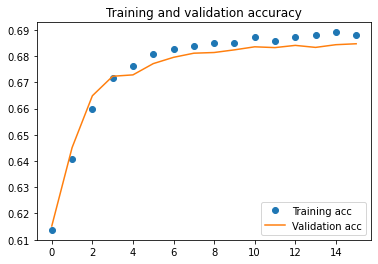

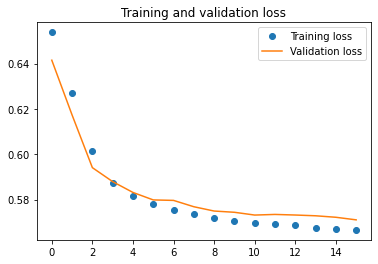

1390/1390 [==============================] - 7s 5ms/step


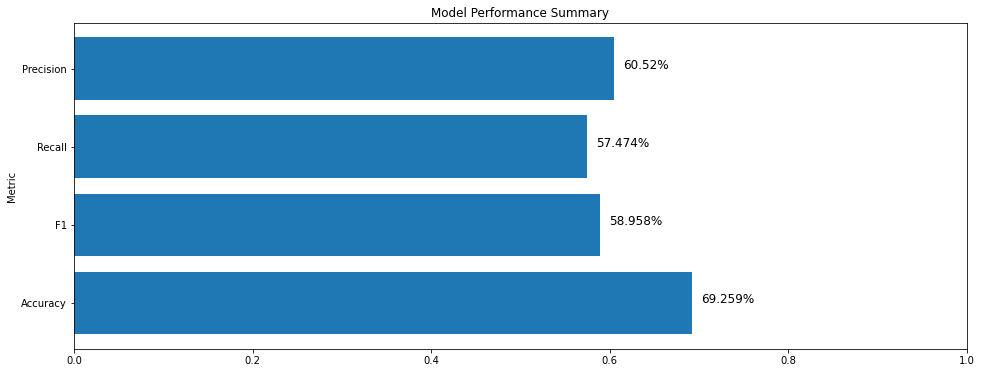

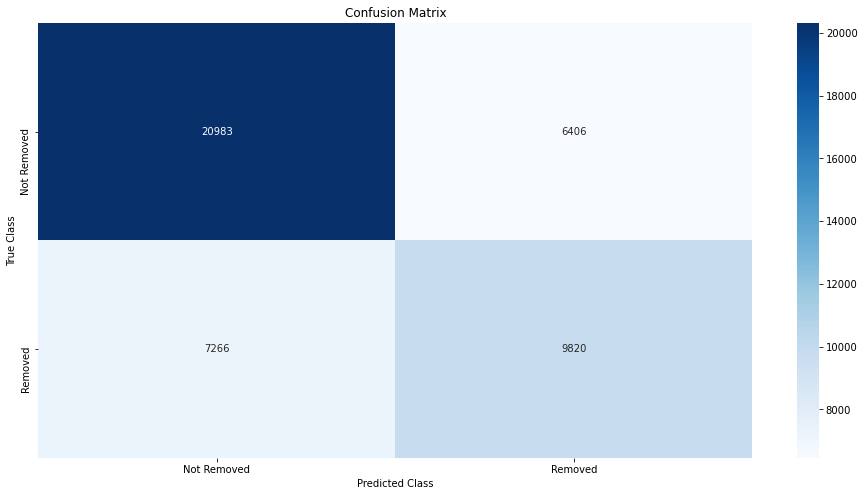

In [28]:
#test model performance
plotResults(results_lstm_w2v)
metrics_lstm_w2v = getScore_lstm(lstm_w2v, test_seq_padded, y_test_final, ['Removed'])
conf_lstm_w2v = getConfusionMatrix_lstm(lstm_w2v, test_seq_padded, y_test_final, ['Not Removed', 'Removed'])
#69% accuracy, nice improvement over NB models

In [29]:
exp_lstm = lstm_w2v
explainer = lime_text.LimeTextExplainer()
explanation = explainer.explain_instance(X_test.iloc[6], lime_predict_lstm, num_samples=5000)
explanation.show_in_notebook()

157/157 [==============================] - 1s 6ms/step


### LSTM with GloVe

The fifth model is very similar to the fourth, this time using pretrained GloVe embeddings rather than Word2Vec embeddings.
Unlike Word2Vec, GloVe focuses on the co-occurrence of words.
Although the resulting model is still an improvement compared to an LSTM model learning its own embeddings, the GloVe embeddings seem less effective than Word2Vec embeddings.

The GloVe embeddings used for this model can be downloaded from https://nlp.stanford.edu/data/glove.6B.zip

After downloading, extract the files and place `glove.6B.300d.txt` into `data/glove/`

In [30]:
#get glove embeddings
glove = dict()

with open('data/glove/glove.6B.300d.txt', 'r', encoding='utf8') as f:
    w = 0
    for line in f.readlines():
        line = line.split(' ')
        
        try:
            glove[line[0]] = np.array(line[1:], dtype=float)
            
        except:
            print('failed on line', w)
            continue
            
embed_matrix_glove = np.zeros((len(vocabulary)+1, 300))

for word, index in vocabulary.items():
    try:
        embed_matrix_glove[index] =  glove[word]
    #skip word if not in glove model
    except:
        pass

In [31]:
#setup and train glove embedding lstm

if exists('models/lstm_glove.h5'):
    lstm_glove = models.load_model('models/lstm_glove.h5')
    results_lstm_glove = pd.read_json('models/results_lstm_glove.json')
else:
    lstm_glove = models.Sequential()
    lstm_glove.add(layers.Input(shape=(15,)))
    lstm_glove.add(layers.Embedding(input_dim=embed_matrix_glove.shape[0],
                                    output_dim=embed_matrix_glove.shape[1],
                                    weights=[embed_matrix_glove],
                                    input_length=15,
                                    trainable=False))
    
    lstm_glove.add(layers.Bidirectional(layers.LSTM(units=15,
                                                    dropout=0.2,
                                                    return_sequences=True)))
    
    lstm_glove.add(layers.Bidirectional(layers.LSTM(units=15,
                                                    dropout=0.2)))
    
    lstm_glove.add(layers.Dense(64, activation='relu'))
    lstm_glove.add(layers.Dense(32, activation='relu'))
    
    lstm_glove.add(layers.Dense(2, activation='softmax'))
    
    lstm_glove.compile(loss='sparse_categorical_crossentropy',
                       optimizer='sgd',
                       metrics=['acc'])
    
    lstm_glove.summary()
    
    results_lstm_glove = lstm_glove.fit(train_seq_padded, y_train_final,
                                        epochs=16,
                                        batch_size=128,
                                        validation_split=0.15,
                                        verbose=1,
                                        callbacks=early_stopping)
    
    lstm_glove.save('models/lstm_glove.h5')
    saveModelHistory(results_lstm_glove, 'models/results_lstm_glove.json')
    results_lstm_glove = results_lstm_glove.history

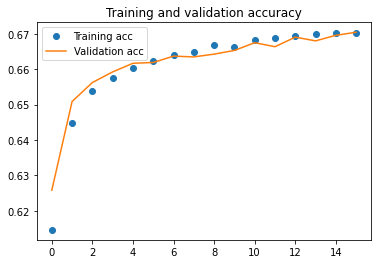

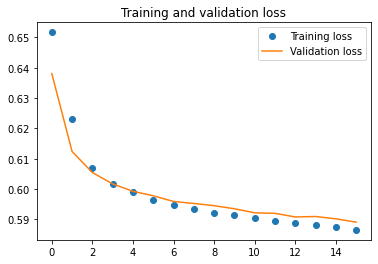

1390/1390 [==============================] - 7s 5ms/step


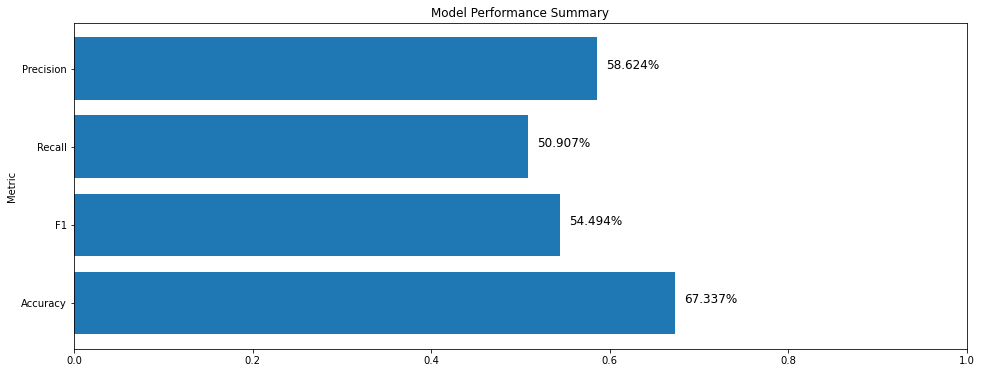

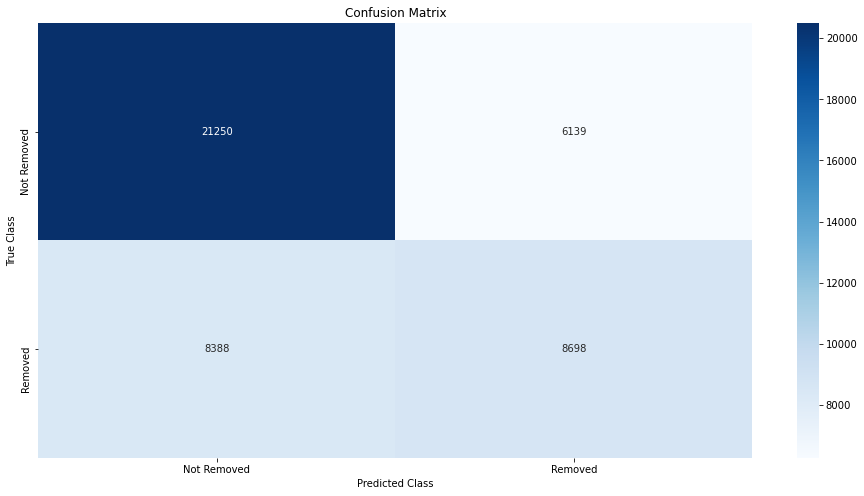

In [32]:
#test model
plotResults(results_lstm_glove)
metrics_lstm_glove = getScore_lstm(lstm_glove, test_seq_padded, y_test_final, ['Removed'])
conf_lstm_glove = getConfusionMatrix_lstm(lstm_glove, test_seq_padded, y_test_final, ['Not Removed', 'Removed'])

In [33]:
exp_lstm = lstm_glove
explainer = lime_text.LimeTextExplainer()
explanation = explainer.explain_instance(X_test.iloc[6], lime_predict_lstm, num_samples=5000)
explanation.show_in_notebook()

157/157 [==============================] - 1s 5ms/step


### Transformer
The sixth model uses a transformer architecture model (specifically, distilbert) instead of an LSTM architecture model. The model was able to achieve a staggering `91.6%` accuracy, an improvement of over 20% compared to the LSTM + Word2Vec model. This performance comes at the cost of extremely slow speed, however.

Due to this very slow speed, the text explainer has been omitted for this model.

In [34]:
#prep data for transformer model
data_tf_all = data_cleaned.copy()
data_tf_all['labels'] = data_tf_all['REMOVED'].astype(int)
data_tf_all.drop(['body', 'REMOVED', 'tokenized', 'no_stop', 'lemma'], axis=1, inplace=True)

sequence_len = 512
tf_batch_size = 16
tf_train_size = 0.85
input_len = len(data_tf_all)
tf_tokenizer = AutoTokenizer.from_pretrained('distilbert-base-uncased')

def organize_ds(input_ids, attention_mask, labels):
        return {'input_ids': input_ids, 'attention_mask': attention_mask}, labels

In [35]:
#load tf dataset if already exists, otherwise format and save
if (exists('data/tf_train') and exists('data/tf_test')):
    
    element_spec = ({'input_ids': tf.TensorSpec(shape=(16, 512), dtype=tf.int32, name=None), 
                    'attention_mask': tf.TensorSpec(shape=(16, 512), dtype=tf.int32, name=None)}, 
                    tf.TensorSpec(shape=(16, 2), dtype=tf.float64, name=None))
    tf_train = tf.data.experimental.load('data/tf_train', element_spec=element_spec)
    tf_test = tf.data.experimental.load('data/tf_test', element_spec=element_spec)
    
else:
    

    tf_tokens = tf_tokenizer(data_tf_all['clean_string'].tolist(), max_length=sequence_len, truncation=True,
                            padding='max_length', add_special_tokens=True,
                            return_tensors='np')

    input_ids_tensor = tf_tokens['input_ids']
    attention_mask_tensor = tf_tokens['attention_mask']
    
    labels_tensor = np.zeros((input_len, 2)) #2 because binary input
    labels_raw = data_tf_all['labels'].values
    labels_tensor[np.arange(input_len), labels_raw] = 1
    
    tf_dataset = tf.data.Dataset.from_tensor_slices((input_ids_tensor, attention_mask_tensor, labels_tensor))

    tf_dataset = tf_dataset.map(organize_ds)

    tf_dataset = tf_dataset.shuffle(100000).batch(tf_batch_size, drop_remainder=True)
    
    train_len = int((input_ids_tensor.shape[0]/tf_batch_size) * tf_train_size)
    
    tf_train = tf_dataset.take(train_len)
    tf_test = tf_dataset.skip(train_len)
    
    tf.data.experimental.save(tf_train, 'data/tf_train')
    tf.data.experimental.save(tf_test, 'data/tf_test')

In [36]:
#check transformer data
print(tf_train.take(1), '\n')

print('length of tf_train + length of tf_test:', (len(tf_train) + len(tf_test)) * 16)

print('tf_train element_spec == tf_test element_spec:', tf_train.element_spec == tf_test.element_spec)

<TakeDataset element_spec=({'input_ids': TensorSpec(shape=(16, 512), dtype=tf.int32, name=None), 'attention_mask': TensorSpec(shape=(16, 512), dtype=tf.int32, name=None)}, TensorSpec(shape=(16, 2), dtype=tf.float64, name=None))> 

length of tf_train + length of tf_test: 222368
tf_train element_spec == tf_test element_spec: True


In [37]:
#setup and train distilbert model
distilbert = TFDistilBertModel.from_pretrained('distilbert-base-uncased')

if exists('models/bert3.h5'):
    tf_model = models.load_model('models/bert3.h5', custom_objects={'TFDistilBertModel': distilbert})
    results_tf = pd.read_json('models/results_bert3.json')
    
else:
    
    #setup model layers
    input_shape = 512
    input_id_layer = layers.Input(shape=(input_shape,), name='input_ids', dtype='int32')
    mask_layer = layers.Input(shape=(input_shape,), name='attention_mask', dtype='int32')



    embeddings = distilbert(input_id_layer, attention_mask=mask_layer)[0][:,0,:]

    tf_dense_1 = layers.Dense(1024, activation='relu')(embeddings)
    tf_dense_2 = layers.Dense(2, activation='softmax')(tf_dense_1)

    tf_model = tf.keras.Model(inputs=[input_id_layer, mask_layer], outputs=tf_dense_2)
    tf_model.summary()

    #setup callbacks
    early_stopping_tf = [EarlyStopping(monitor='val_loss', patience=1, restore_best_weights=True)]
    
    #setup optimizer and compile
    opt = tf.keras.optimizers.Adam(learning_rate=1e-5, decay=1e-6)

    tf_model.compile(loss='categorical_crossentropy',
                           optimizer=opt,
                           metrics=['acc'])
    
    #train
    results_tf = tf_model.fit(tf_train, validation_data=tf_test, epochs=12, verbose=1, callbacks=early_stopping_tf)
    
    #save model and train history
    tf_model.save('models/bert3.h5')

    saveModelHistory(results_tf, 'models/results_bert3.json')
    results_tf = pd.read_json('models/results_bert3.json')

Some layers from the model checkpoint at distilbert-base-uncased were not used when initializing TFDistilBertModel: ['vocab_transform', 'vocab_projector', 'vocab_layer_norm', 'activation_13']
- This IS expected if you are initializing TFDistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFDistilBertModel were initialized from the model checkpoint at distilbert-base-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertModel for predictions without further training.


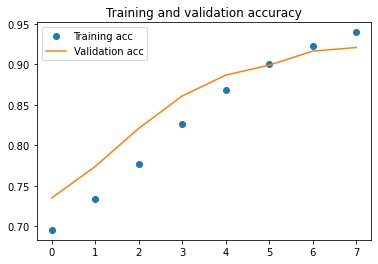

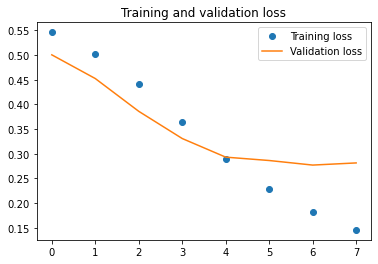

In [38]:
plotResults(results_tf)

In [39]:
#load distilbert model prediction results if saved, otherwise predict and save
tf_test_labels = np.concatenate([y for x, y in tf_test], axis=0)
if exists('data/db_preds.gz'):
    db_preds = np.loadtxt('data/db_preds.gz')
else:
    db_preds = tf_model.predict(tf_test)
    np.savetxt('data/db_preds.gz', db_preds)


db_pred_processed = []
for value in db_preds:
    if value[0] > value[1]:
        db_pred_processed.append(1)
    else:
        db_pred_processed.append(0)

Text(0, 0.5, 'Metric')

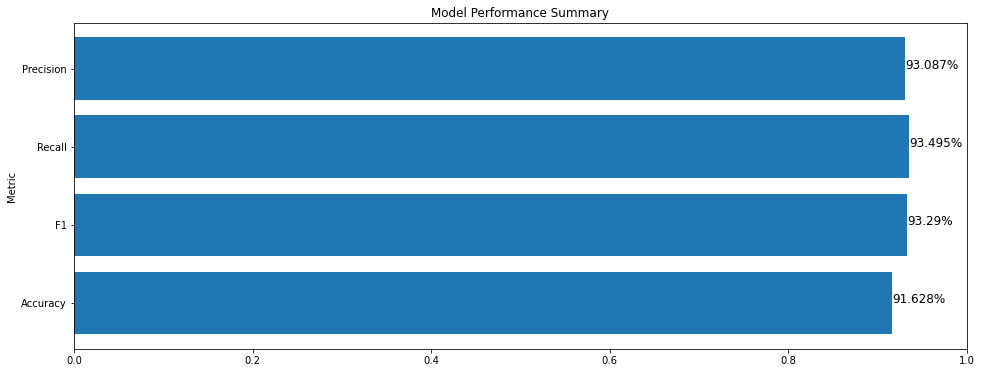

In [40]:
#display distilbert metrics
db_results = {}
db_results['Accuracy'] = accuracy_score(tf_test_labels[:,0], db_pred_processed)
db_results['F1'] = f1_score(tf_test_labels[:,0], db_pred_processed, average='binary')
db_results['Recall'] = recall_score(tf_test_labels[:,0], db_pred_processed, average='binary')
db_results['Precision'] = precision_score(tf_test_labels[:,0], db_pred_processed, average='binary')

fig, ax = plt.subplots(figsize=(16,6))
ax.barh((range(len(db_results))), db_results.values(), align='center')
plt.xlim(0, 1.0)
plt.yticks(np.arange(len(db_results)), db_results.keys())
for i, v in enumerate(db_results.values()):
    plt.text(v + 0.0001, i - 0.001, str(round((v * 100),3)) + '%', fontsize=12)
plt.title('Model Performance Summary')
plt.ylabel('Metric')

Text(123.0, 0.5, 'True Class')

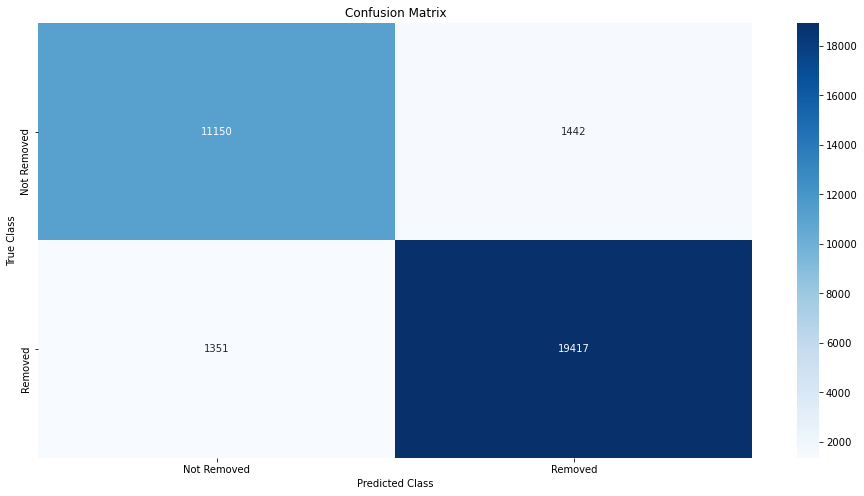

In [41]:
matrix_raw = confusion_matrix(tf_test_labels[:,0], db_pred_processed)
dfMatrix = pd.DataFrame(matrix_raw, index=labels, columns=labels)
plt.subplots(figsize=(16,8))
sns.heatmap(dfMatrix, annot=True, robust=True, fmt='g', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Class')
plt.ylabel('True Class')

## Conclusion

### Model Evaluation
When comparing the metrics of the different models, there are several conclusions:
* On it's own, LSTM architecture performs only slightly better than Naive Bayes.
    * Despite being more computationally intensive, the basic LSTM model only achieves 1% higher accuracy compared to the tuned Naive Bayes model.
* If LSTM is combined with external embeddings it becomes much more effective.
    * A significant (2.8 - 4.8%) increase in accuracy can be seen in both cases where external embeddings are given to the model, although the Word2Vec embeddings performed better.
* Transformer architecture vastly outperformed all other models.
    * The distilbert model achieved the best scores by far: 91.6% accuracy, 22.3% better than the next best model.

The distilbert model has the best performance by far, and is therefore chosen as the final model for this project.
However, as the next section will discuss, the speed of this final model is a limiting factor under the specific circumstances of this project.

The graphs below show the scores of the models for various metrics. The final model's scores are highlighted in red.

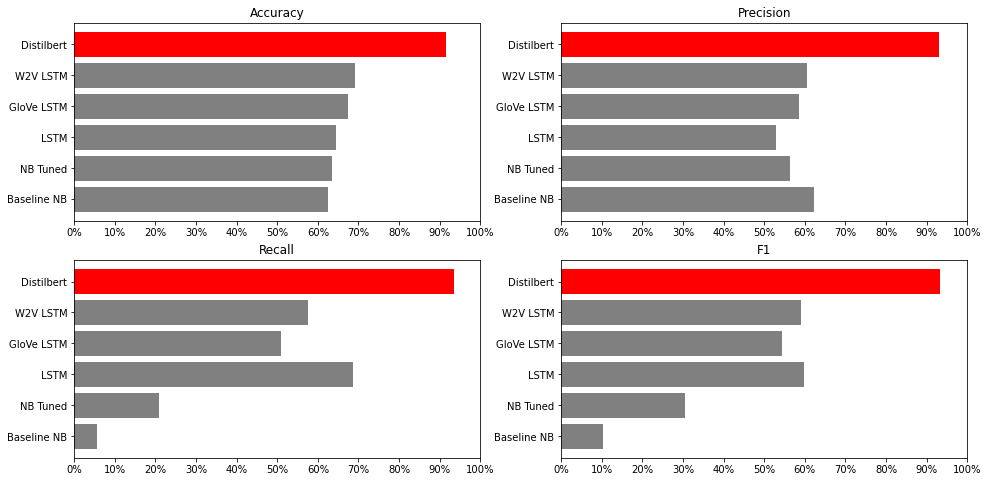

In [42]:
#display metrics for all models
model_scores = {
    'Baseline NB' : test_baseline.drop('Not Removed'),
    'NB Tuned' : test_NB_stop_lemma.drop('Not Removed'),
    'LSTM' : metrics_lstm_base,
    'GloVe LSTM' : metrics_lstm_glove,
    'W2V LSTM' : metrics_lstm_w2v,
    'Distilbert' : db_results
}
#print(model_scores)
metric_list = ['Accuracy', 'Precision', 'Recall', 'F1']
#cur_metric = 'Accuracy'
w = 0
fig, ax = plt.subplots(figsize=(16,8), nrows=2, ncols=2)
ax_list = ax.flatten()

for cur_metric in metric_list:
    score_list = []

    model_names = []
    for model_name in model_scores.keys():
        model_results = model_scores[model_name]
        #print(model_name, float(model_results[cur_metric]))
        model_names.append(model_name)
        score_list.append(float(model_results[cur_metric]))

    #print(score_list)


    if w == 0:
        color_list = ['gray','gray','gray','gray','gray','r']
    else:
        color_list = ['gray','gray','gray','gray','gray','r']
    ax_list[w].barh((range(len(score_list))), score_list, align='center', color= color_list)
    ax_list[w].set_yticks(np.arange(len(model_names)))
    ax_list[w].set_yticklabels(model_names)
    ax_list[w].set_xlim(0, 1.0)
    ax_list[w].set_title(cur_metric)
    ax_list[w].xaxis.set_major_formatter(mtick.PercentFormatter(1.0))
    ax_list[w].set_xticks([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])
    #ax_list[w].set_xlabel(cur_metric + ' Score')
    #ax_list[w].set_ylabel('Model')
    w += 1

### Model Speed

This section compares the speed of the models, rather than their accuracy.

The results are as follows:
*	The fastest models are the low accuracy Naive Bayes models, performing predictions on the entire test set in under a second.
*	The LSTM models are slower than the Naive Bayes models, taking around 7 seconds to make predictions on the test set.
*	The final model is much slower, taking over 10 seconds to complete just 16 predictions. 
	Based on this, I predict it would take several hours to make predictions for the whole test set.

Because this project deals with content moderation for a forum, not a live chatroom, the final model does not need to be instantaneous. By allocating additional resources, I expect the final model could achieve sufficient speed to be used for this task.

In the case of this project, however, this slow speed makes the final model very difficult to work with.
Therefore, the next best model (LSTM + Word2Vec) is used in its place for the following sections.

The cell below visualizes this difference in speed between the models.

In [43]:
#calc and display model time

predict_count = 10000

tmp = time.time()
time_preds = baseline_model.predict(X_test_vectorized_base)
total_time_base = time.time() - tmp
time_1k_base = (total_time_base/X_test_vectorized_base.shape[0]) * predict_count

tmp = time.time()
time_preds = NB_stop_lemma.predict(X_test_vectorized_clean)
total_time_NB = time.time() - tmp
time_1k_NB = (total_time_NB/X_test_vectorized_clean.shape[0]) * predict_count

tmp = time.time()
time_preds = lstm_base.predict(test_seq_padded)
total_time_lstm_base = time.time() - tmp
time_1k_lstm_base = (total_time_lstm_base/len(test_seq_padded)) * predict_count

tmp = time.time()
time_preds = lstm_w2v.predict(test_seq_padded)
total_time_lstm_w2v = time.time() - tmp
time_1k_lstm_w2v = (total_time_lstm_w2v/len(test_seq_padded)) * predict_count

tmp = time.time()
time_preds = lstm_glove.predict(test_seq_padded)
total_time_lstm_glove = time.time() - tmp
time_1k_lstm_glove = (total_time_lstm_glove/len(test_seq_padded)) * predict_count

tmp = time.time()
time_preds = tf_model.predict(tf_test.take(1)) #just using first index of tf_test for sake of time
total_time_distilbert = time.time() - tmp
time_1k_distilbert = (total_time_lstm_glove/16) * predict_count #divided by 16 because tf_test has batches of 16

time_scores = {
    'Baseline NB' : time_1k_base,
    'NB Tuned' : time_1k_NB,
    'LSTM' : time_1k_lstm_base,
    'GloVe LSTM' : time_1k_lstm_glove,
    'W2V LSTM' : time_1k_lstm_w2v,
    'Distilbert' : time_1k_distilbert
}
#print(time_scores)

1/1 [==============================] - 14s 14s/step


Text(0.5, 0, 'Time in Seconds')

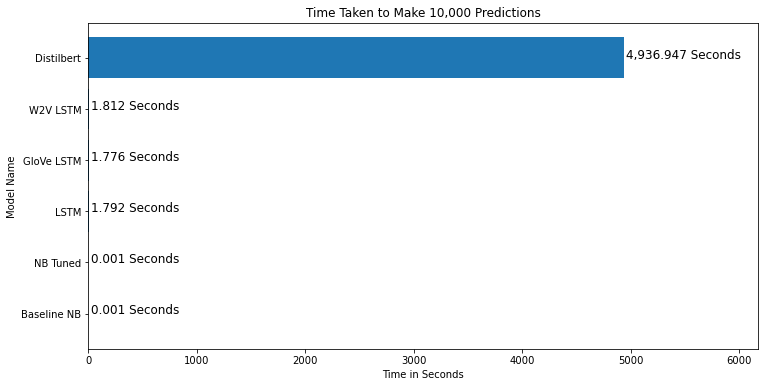

In [44]:
fig, ax = plt.subplots(figsize=(12,6))
ax.barh((range(len(time_scores))), time_scores.values(), align='center')
plt.xlim(0, time_1k_distilbert * 1.25)
plt.yticks(np.arange(len(time_scores)), time_scores.keys())
for i, v in enumerate(time_scores.values()):
    plt.text(v + (time_1k_distilbert/230), i - 0.001, f"{v:,.3f}" + ' Seconds', fontsize=12)
plt.title('Time Taken to Make ' + f"{predict_count:,}" + ' Predictions')
plt.ylabel('Model Name')
plt.xlabel('Time in Seconds')

### Model Explanation

Having an explainable model is a significant benefit, as understanding why the model makes the decisions it does allows one to ensure the model is following sound logic.
The cell below shows the explanation of the models prediction for a particular comment.
Words that are highlighted in orange increase the likelihood of removal, while words highlighted in blue do the opposite.
Note that the word "pot" is more likely to result in removal compared to the word "marijuana", although both words increase the chance.

In the case of content moderation, this explainability can provide an additional benefit: 
Because the model is trained on comments filtered by the current moderation system, 
these explanations provide insight into current moderation practices. 
Having an understanding what sort of words get comments removed could give insight on how moderation policies might be improved.

In [45]:
def exp_demo_clean(input_str):
    #lowercase
    text = input_str.lower()
    #remove special chars
    pattern = r"(?u)\b\w\w+\b"
    tokenizer = RegexpTokenizer(pattern)
    text = tokenizer.tokenize(text)
    #remove stopwords
    text = remove_stopwords(text)
    #lemma
    lemma = nltk.stem.wordnet.WordNetLemmatizer()
    text = [lemma.lemmatize(word) for word in text]
    #back to string
    text_str = ' '.join(text)
    #print(text_str)
    return text_str
    
def exp_demo_predict(text):
    final_output = []
    predict_input = []
    for text_variant in text:
        text_variant = exp_demo_clean(text_variant)
        #tokenize
        input_list_tokenized = [text_variant.split(' ')]
        #sequence
        input_sequence = tokenizer.texts_to_sequences(input_list_tokenized)
        #padding
        input_seq_padded = tf.keras.preprocessing.sequence.pad_sequences(input_sequence,
                                                                            maxlen=15, 
                                                                            padding='post', 
                                                                            truncating='post')
        predict_input.append(input_seq_padded[0].tolist())
    predict_output = exp_lstm.predict(predict_input)
    
    return predict_output

def predict_func_final(input_text):
    predictions = exp_demo_predict(input_text)
    return predictions

exp_demo_text = data_cleaned['body'][80539]

exp_lstm = lstm_w2v
explainer = lime_text.LimeTextExplainer()
explanation = explainer.explain_instance(exp_demo_text, predict_func_final, 
                                        num_samples=50000, 
                                        labels=(1,))
explanation.show_in_notebook()

1563/1563 [==============================] - 8s 5ms/step


### Deployment Considerations

The final model's accuracy of 91.6% is certainly sufficient to be of use if deployed to help automate content moderation.
However, allowing the model to directly remove comments is not recommended, as although the model's accuracy is high, it is far from flawless.
Even if it only happens occasionally, having a comment removed unfairly is a major inconvenience from the perspective of a user.
Thus, the risks of deploying the model in this way outweighs the potential benefit.

The solution this project proposes is to have the model tag and withhold comments that it detects as being in violation of the rules, rather than remove them outright.

A human moderator can then check tagged comments and make the final decision on removal.
Human involvement also allows for citing which rule the offending comment has broken, which the model is incapable of doing on its own.
This will stop most unwanted content from reaching other users, significantly reducing the need for users to report comments.
This results in a better overall user experience, which will promote user engagement.



## Next Steps
* Further explore potential of transformer architecture models
	* Given that Distilbert is a lighter-weight version of the original Bert model, it's likely that more powerful models could be created if given more computing resources to train and tune them.
* Investigate more advanced methods of model explanation
    * The text explainer used in this project, lime, achieves its results from a brute force approach. A more robust model explainer could yield deeper insights, especially if it could leverage transformer architecture's attention system.